# Tutorial FFNN ROM of NLEBB - Part 2
Using neural networks for reduced order modelling (ROM) of the nonlinear Euler-Bernoulli beam (NLEBB), by learning the *internal energy*.

---

Lecture: "Physics-augmented machine learning" @ Cyber-Physical Simulation, TU Darmstadt

Lecturer: Prof. Oliver Weeger

Author: Jasper O. Schommartz

Summer term 2025

---

#### In this notebook, you will...

* calibrate an FFNN to model the internal energy of a system.
* understand how the model can be built using Sobolev training.
* investigate the effect of including convexity conditions in the description of a potential

In [ ]:
# Run this cell if you are using Google Colab
!git clone https://github.com/CPShub/LecturePhysicsAwareML.git
%cd LecturePhysicsAwareML/FFNN_ROM
%pip install -e.

In [ ]:
# Run this cell if your are working locally
%cd ..
% pip install -e.

## 1. Recap of ROM with POD

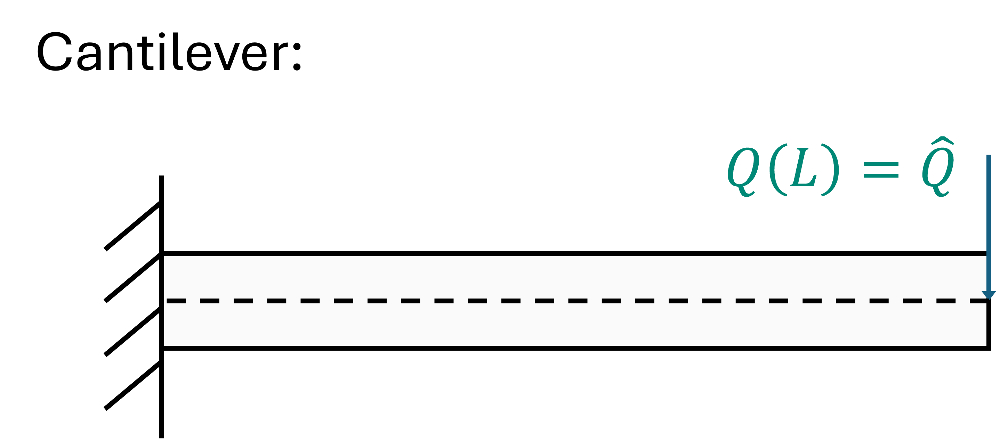

Proper orthogonal decomposition (POD) is a data-driven method for finding a reduced basis that approximates the behavior of a dynamical system. Based on the snapshot matrix $\mathbb{S} = (\boldsymbol{u}_1,\boldsymbol{u}_1, ...) \in \mathbb{R}^{N\times M}$, which contains time series data of the degrees of freedoms, e.g. displacements, the reduced basis $\boldsymbol{Q} = (\mathbb{u}_1, ..., \mathbb{u}_m) \in \mathbb{R}^{N \times m}$ is found using singular value decomposition (SVD).

After applying POD to the dynamics of the nonlinear Euler-Bernoulli beam, the behavior can be described by the following nonlinear differential equation

$$
\boldsymbol{Q}^T \boldsymbol{M} \boldsymbol{Q} \ddot{\boldsymbol{q}} + \tilde{\boldsymbol{f}}(\boldsymbol{q}) = \boldsymbol{Q}^T \boldsymbol{b}(t),
$$

where the nonlinear function $\tilde{\boldsymbol{f}}(\boldsymbol{q}) = \boldsymbol{Q}^T \boldsymbol{f}(\boldsymbol{Q}\boldsymbol{q})$ describes the internal forces in terms of the reduces degrees of freedom $\boldsymbol{q}$. The simulation of the equation above requires a time integration scheme. For this lecture the Newmark method was implemented in the `nlebb_dynamic_proj.m` MATLAB script. It makes use of the linearization of $\tilde{\boldsymbol{f}}(\boldsymbol{q})$, which is given in terms of the reduced stiffnes matrix $\tilde{\boldsymbol{K}} = \boldsymbol{Q}^T \boldsymbol{K} \boldsymbol{Q}$. $\tilde{\boldsymbol{K}}(\boldsymbol{q})$ is related to $\tilde{\boldsymbol{f}}(\boldsymbol{q})$ via the derivative as

$$
\tilde{\boldsymbol{K}(\boldsymbol{q})} = \frac{\partial \tilde{\boldsymbol{f}}(\boldsymbol{q})}{\partial \boldsymbol{q}}
$$

**Modelling the internal energy:**

We know that the linear Elastic beam is a conservative system, i.e, there is no damping and energy is preserved. Therefore, the existence of an internal energy $\psi(\boldsymbol{q})$ can be assumed, where the internal forces forces follow from the derivative with respect to the reduced DOFs $\boldsymbol{q}$ as

$$
\tilde{\boldsymbol{f}}(\boldsymbol{q}) = \frac{\partial \psi(\boldsymbol{q})}{\partial \boldsymbol{q}}.
$$

This relation can be implemented into the architecture of our FFNN based model to fulfill energy conservation by construction.

## 2. Task summary

In this task we aim to train a FFNN-based model that approximates the internal energy $\psi(\boldsymbol{q})$ of the nonlinear Euler-Bernoulli beam. It will be calibrated using Sobolev trainig with its first and second derivatives $\tilde{\boldsymbol{f}}(\boldsymbol{q})$ and $\tilde{\boldsymbol{K}(\boldsymbol{q})}$, respectively.

The task involves four step, where one is covered by this notebook:

1. Determination of the reduced basis using POD and SVD (`nlebb_dynamic_svd.m`)
2. Generation of training and test data sets for $\boldsymbol{q}$, $\tilde{\boldsymbol{f}}$, and $\tilde{\boldsymbol{K}}$ using the reduced basis (`nlebb_dynamic_proj.m`)
3. Training and evaluation of a FFNN-based surrogate model (this Jupyter Notebook)
4. Application of the FFNN in the beam simulation (`nlebb_dynamic_proj.m`)

## 3. FFNN-based model

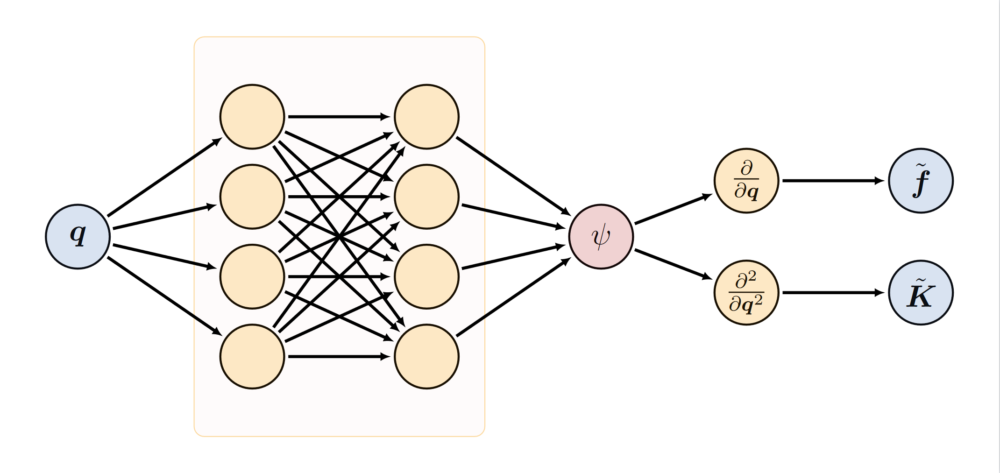

The model consists of of three custom layers. `MLP` represents the FFNN, which has a scalar output and returns the internal energy $\psi(\boldsymbol{q})$. `Hessian` computes the gradients of the FFNN with respect to its inputs, which corresponds to the internal force vector $\tilde{\boldsymbol{f}}(\boldsymbol{q})$, and the hessian matrix, which corresponds to the internal stiffness matrix $\tilde{\boldsymbol{K}(\boldsymbol{q})}$. The gradients are computed using automatic differentiation with the `tf.GradientTape()` module provided by Tensorflow.

In [1]:
import tensorflow as tf
from tensorflow.keras import layers


class MLP(layers.Layer):
    """A feed-forward neural network"""

    def __init__(self, units, activation, non_neg):
        super().__init__()
        self.layers = []
        for u, a, n in zip(units, activation, non_neg):
            if n:
                kernel_constraint = tf.keras.constraints.non_neg()
            else:
                kernel_constraint = None
            self.layers += [layers.Dense(u, a, kernel_constraint=kernel_constraint)]

    def call(self, x):
        for layer in self.layers:
            x = layer(x)
        return x


class Hessian(layers.Layer):
    """Computes the gradient and hesian of another layer and returns
    it together with the function value"""

    def __init__(self, layer):
        super().__init__()
        self.layer = layer
        self.flatten = layers.Flatten()

    def call(self, x):
        with tf.GradientTape() as g0:
            g0.watch(x)
            with tf.GradientTape() as g1:
                g1.watch(x)
                y = self.layer(x)
            dy = g1.gradient(y, x)
        ddy = g0.batch_jacobian(dy, x)
        return y, dy, self.flatten(ddy)

To create the model, the `build()` function is called. It connects the input values to the output values and compiles the model with the desired optimizer and loss function. By setting the `loss_weights` property, the importance of every output can be adjusted for better training.

In this case the first component of `loss_weights` has to be zero, as we do not have data for the internal energy $\psi(\boldsymbol{q})$. The second component of `loss_weights` represents the weight of the error on $\tilde{\boldsymbol{f}}(\boldsymbol{q})$, while the third component represents the weight of the error on $\tilde{\boldsymbol{K}(\boldsymbol{q})}$. Here, the error is defined as the *mean squared error*, which is a typical choice in scientific machine learning.

In [2]:
def build(qm, loss_weights=[0, 1, 1], *args, **kwargs):
    """Builds an evaluation model that returns the nodal displacements"""
    # define input shape
    x = tf.keras.Input(shape=(qm,))
    # define which (custom) layers the model uses
    mlp = MLP(*args, **kwargs)
    y, dy, ddy = Hessian(mlp)(x)
    # connect input and output
    model = tf.keras.Model(inputs=[x], outputs=[y, dy, ddy])
    # define optimizer
    model.compile("adam", loss=["mse", "mse", "mse"], loss_weights=loss_weights)
    return model

## 4. Data generation and Preprocessing

Data generation is contucted a-priori via execution of the `nlebb_dynamic_svd.m`and `nlebb_dynamic_proj.m` scripts. The following types of excitations of the cantilever beam were used for data generation:

* Quasi-static: $Q(t) = A/5 \cdot t$
* Dirac: $Q(t) = A\ \text{if}\ 2.5 < t < 2.51$
* Step: $Q(t) = A\ \text{if}\ t > 2.5$
* Sine: $Q(t) = A \sin(2 \pi f t)$
* Multisine with phase shift: $Q_i(t) = \sum_{k=1}^{n} y_{i, k}(t)\quad$ with $\quad y_{i, k}(t) = A_k \sin(2 \pi f_k t + \varphi_k + \phi_i)\quad$ and $\quad \varphi_k = \frac{-k(k-1)}{n}\pi\quad$ and $\quad \phi_i = \frac{2 \pi (i -1)}{n_{ph}}$

**Training cases**:

* Multisine with $A = 2 N$, $n = 100$, $f_0 = 0.085 Hz$, $n_{ph} = 3$, $i = 1, ..., 3$ and a total simulation time of $t_{max} = 5s$

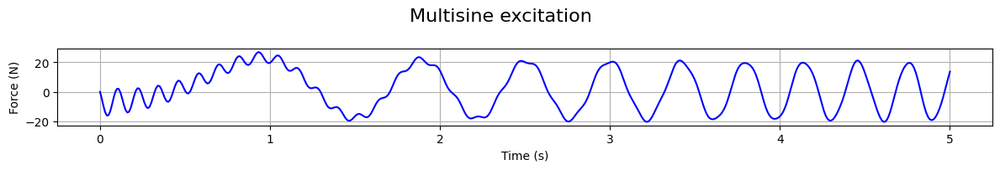

In [3]:
import numpy as np
import paml_rom.data as data

t = np.linspace(0, 5, 500)
data.multisin(2, 0.085, 100, 0, 3, t)

**Test cases**:

* Quasi-static with $A = -10$
* Dirac with $A = -10$
* Step with $A = -10$
* Sine with $A = 1.5 N$ and $f = 6 Hz$
* Multisine with $A = 1 N$, $n = 78$, $f_0 = 0.103 Hz$, $n_{ph} = 1$, $i = 1$

All training and test cases were simulated for a total time of $t_{max} = 5s$.

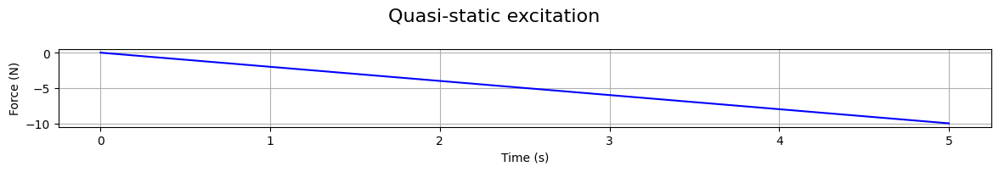

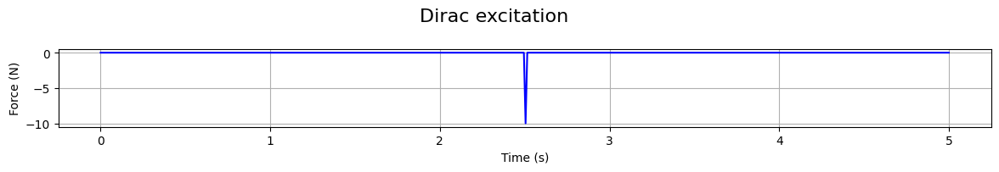

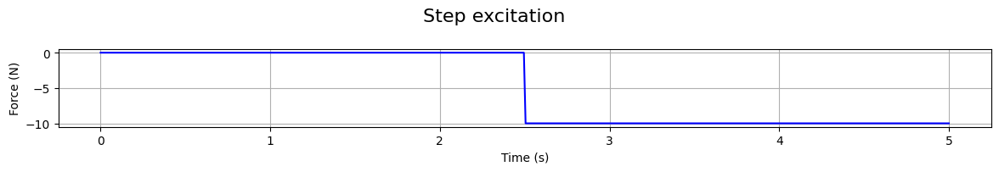

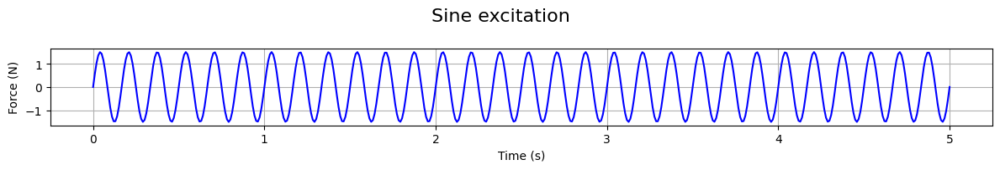

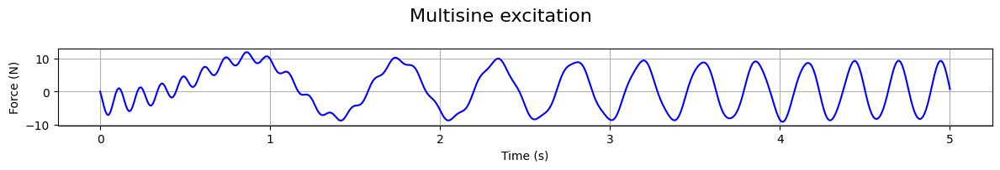

In [4]:
data.quasistatic(-10, t)
data.dirac(-10, 2.5, t)
data.step(-10, 2.5, t)
data.sine(1.5, 6, t)
data.multisin(1, 0.103, 78, 0, 1, t)

At first, the training data is loaded from the `Tasks/FFNN/data/` directory.

In [5]:
from pathlib import Path
from paml_rom import data

# Select training directory and files
data_dir = Path("..") / "data" / "multisin_train"
files_q = ["q0all_1.txt", "q0all_2.txt", "q0all_3.txt"]
files_Qf = ["Qfall_1.txt", "Qfall_2.txt", "Qfall_3.txt"]
files_QKQ = ["QKQall_1.txt", "QKQall_2.txt", "QKQall_3.txt"]

# Read data from txt files
q, Qf, QKQ = data.read_data(data_dir, files_q, files_Qf, files_QKQ)
m = q.shape[0]
n = q.shape[1]

print(f"Loaded {m} data samples.")

Loaded 48003 data samples.


The data is visualized to obtain an understanding of the data and indentify characteristics that could impact training. Important factors are, e.g.,

* the magnitude of values in the data set,
* the variety of the points in the data set.

**Task**: Take a look at the plotted data and try to answer the following questions:

* Why don't we normalize the data despite the discrepancy in the orders of magnitude?
* What other solutions are there for fitting data with different magnitudes?

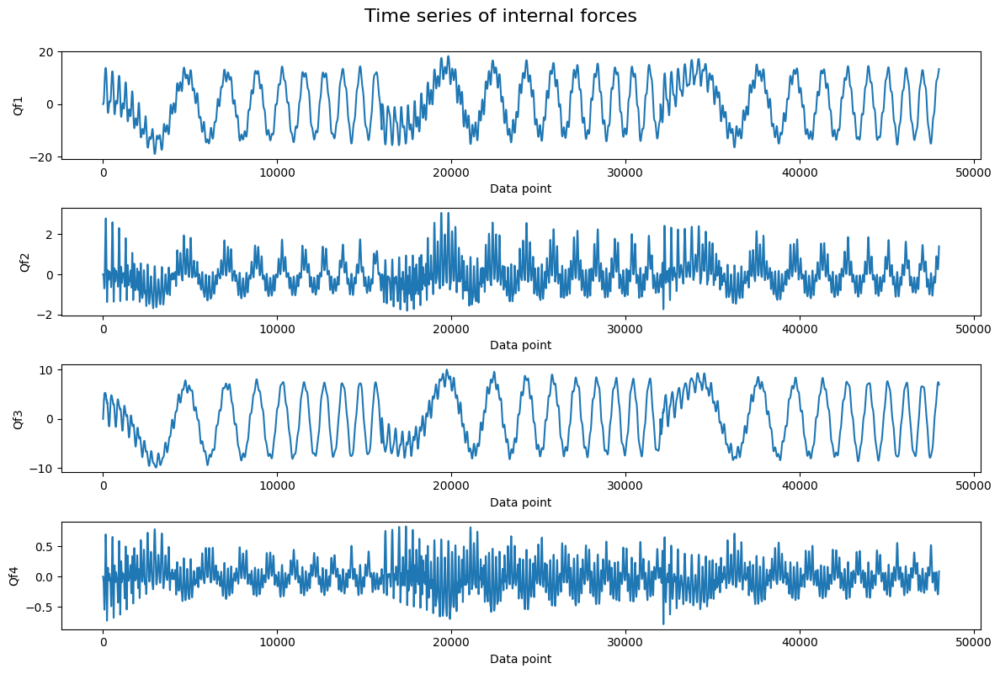

In [6]:
from paml_rom import plot

plot.plot_forces(Qf)

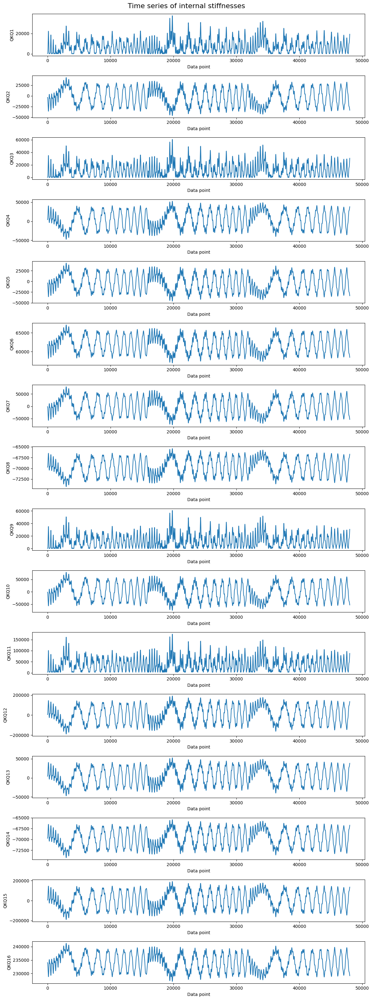

In [7]:
from paml_rom import plot

plot.plot_stiffnesses(QKQ)

## 5. Buliding and calibrating the model

The `build()` function is called with the desired `loss_weights`, `units`, i.e., node number, `activation` and `non_neg` constraints.

**Task**: Make changes to the number of nodes as well as the loss weights and investigate the impact on model performance. Keep in mind that the first value of `loss_weights` must remain zero.

In [8]:
model = build(
    qm=n,
    loss_weights=[0, 1, 5e-7],  # [0, 1, 5e-7],
    units=[16, 16, 1],
    activation=["softplus", "softplus", "linear"],
    non_neg=[False, False, False],
)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 4)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hessian (Hessian)               │ [(None, 1), (None, 4), │           369 │
│                                 │ (None, 16)]            │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 369 (1.44 KB)

 Trainable params: 369 (1.44 KB)

 Non-trainable params: 0 (0.00 B)

Next, the model is fitted to the training data after defining the number of training epochs, i.e, `NEPOCHS`, and the learning rate for the ADAM optimizer.

**Tasks:**

* Make changes to the numper of epochs as well as the learning rate and investigate the impact on model performance.
* Why are we passing $q$ as output in the `model.fit()` function. Does is have an effect on the training? Explain your answer.

Epoch 1/50000
47/47 - 1s - 27ms/step - hessian_loss: 5731576832.0000 - loss: 2893.9392
Epoch 2/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731703808.0000 - loss: 2893.9087
Epoch 3/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731655680.0000 - loss: 2893.8652
Epoch 4/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731609600.0000 - loss: 2893.7622
Epoch 5/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731833856.0000 - loss: 2893.5251
Epoch 6/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731732992.0000 - loss: 2892.9756
Epoch 7/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731599360.0000 - loss: 2891.7620
Epoch 8/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731417088.0000 - loss: 2889.3923
Epoch 9/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731408896.0000 - loss: 2885.5071
Epoch 10/50000
47/47 - 0s - 2ms/step - hessian_loss: 5731003904.0000 - loss: 2880.3130
Epoch 11/50000
47/47 - 0s - 2ms/step - hessian_loss: 5730910720.0000 - loss: 2874.7744
Epoch 12/50000
47/47 - 0s - 2ms/step - hessian_loss

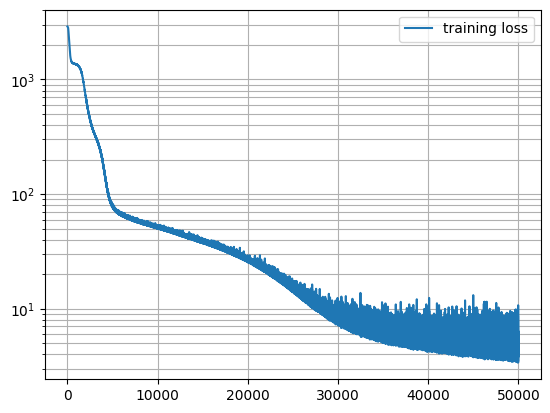

In [9]:
from matplotlib import pyplot as plt

NEPOCHS = 50000
model.optimizer.learning_rate.assign(0.001)
h = model.fit([q], [q, Qf, QKQ], epochs=NEPOCHS, verbose=2, batch_size=1024)

plt.semilogy(np.linspace(1, NEPOCHS, NEPOCHS), h.history["loss"], label="training loss")
plt.grid(which="both")
plt.legend()
plt.show()

The model is saved for later use and the weights are saved in a txt file for use in the beam simulation.

In [10]:
# Save model
name = "potential"
model.save_weights(f"{name}.weights.h5")

# Save weights to list and txt-file
with open(f"{name}.weights.txt", "w") as f:
    for weights in model.get_weights():
        weights = weights.reshape(-1)
        f.write(" ".join(str(val) for val in weights) + "\n")

*Run this cell if you want to load a pre-trained model*

In [48]:
from pathlib import Path

fname = "potential.weights.h5"
model.load_weights(fname)

## 6. Evaluation

To evaluate the performance of the trained model, it must be tested on unseen data.

### 6.1 Evaluation on training data

However, in the first step we reevaluate the model on the training data to check that no underfitting has occured.

In [11]:
from paml_rom import evaluation as eval

# Get model predictions
E_pred, Qf_pred, QKQ_pred = model(q)

# Evaluate
df_Qf_pred, df_QKQ_pred = eval.evaluate(Qf, Qf_pred, QKQ, QKQ_pred)
df_Qf_pred

c:\Users\schommartz\Documents\git_environment\LecturePhysicsAwareML\FFNN_ROM\.venv\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(48003, 4))
  warnings.warn(msg)


,Qf1,Qf2,Qf3,Qf4
MSE,0.506191,2.429692,0.530776,1.167618
R2,0.993932,-3.125088,0.981361,-18.816301


In [12]:
df_QKQ_pred

,QKQ1,QKQ2,QKQ3,QKQ4,QKQ5,QKQ6,QKQ7,QKQ8,QKQ9,QKQ10,QKQ11,QKQ12,QKQ13,QKQ14,QKQ15,QKQ16
MSE,566897.203021,2.046331e+06,487624.296068,381517.680635,2.046330e+06,1.018824e+07,2.958136e+06,2.960093e+06,487624.601504,2.958132e+06,7.407799e+06,8.678140e+06,381518.169725,2.960095e+06,8.678139e+06,1.742672e+07
R2,0.986530,9.952073e-01,0.995714,0.999299,9.952073e-01,-8.477369e-01,9.977040e-01,2.978903e-01,0.995714,9.977040e-01,9.922320e-01,9.988905e-01,0.999299,2.978898e-01,9.988905e-01,-6.014448e-01


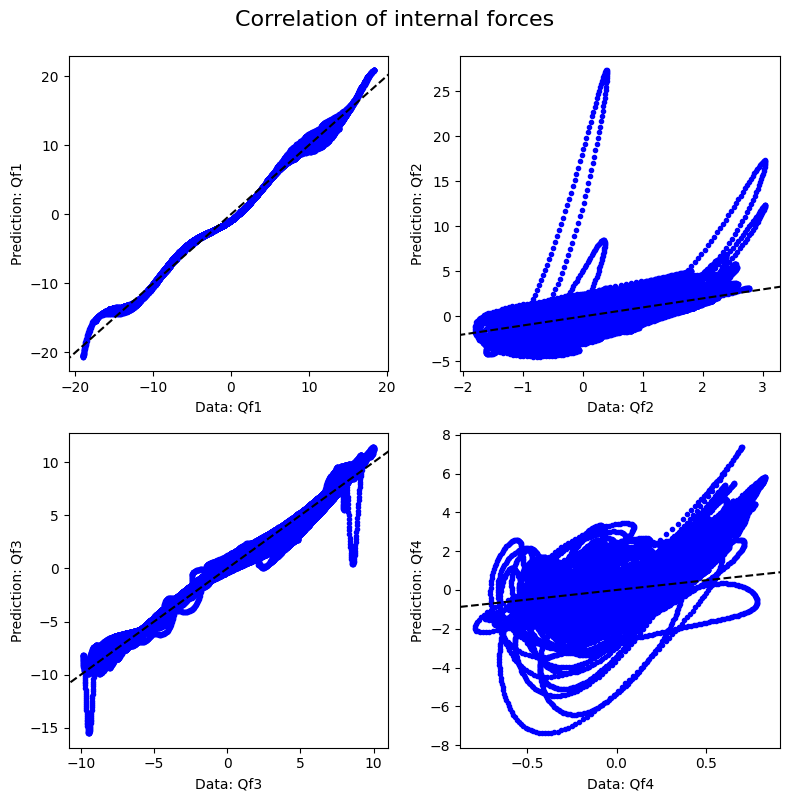

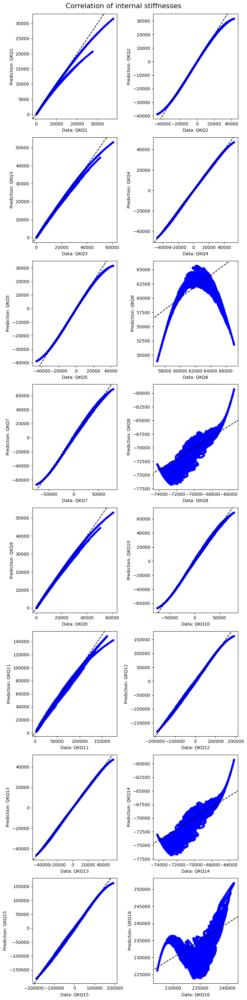

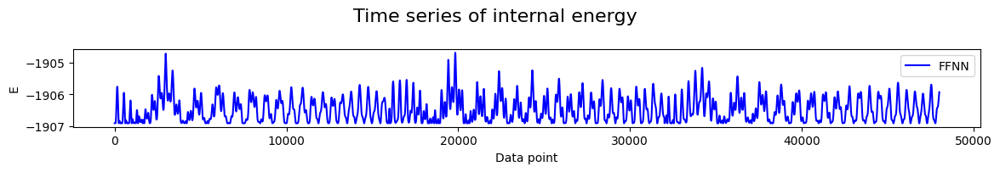

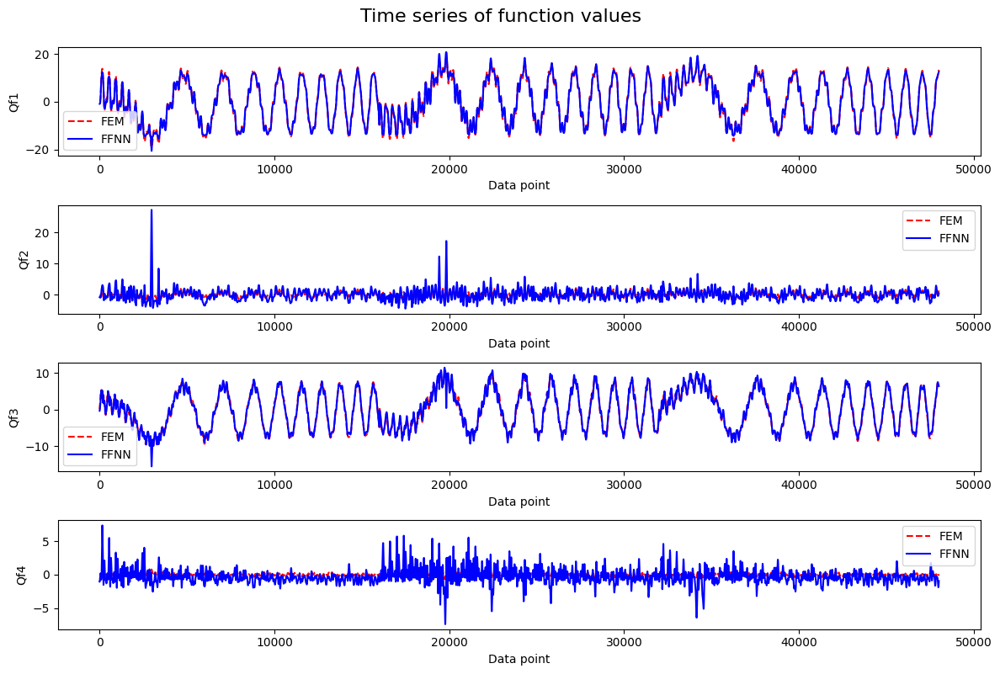

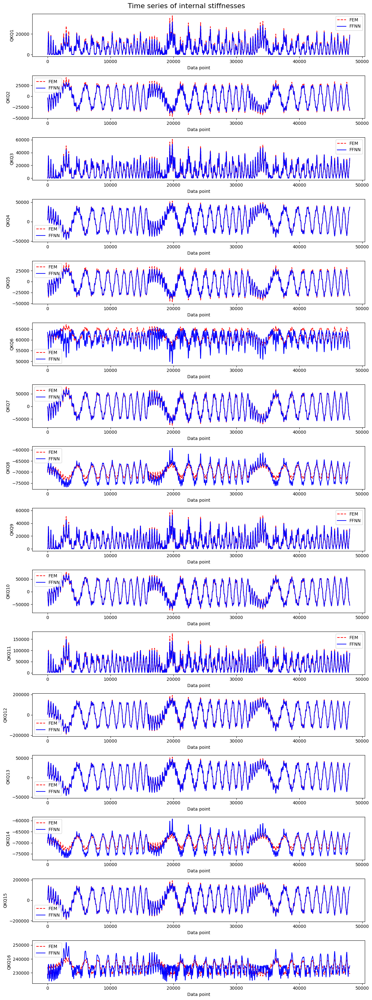

In [13]:
from paml_rom import plot

plot.plot_predictions(q, Qf, Qf_pred, QKQ, QKQ_pred, E_pred)

### 6.2 Evaluation on testing data

Finally, the model is evaluated on the testing data.

In [14]:
from pathlib import Path
import paml_rom.data as data
import paml_rom.evaluation as eval


# Select testing directory and files
data_dir = Path("..") / "data" / "step_test"
files_q = ["q0all.txt"]
files_Qf = ["Qfall.txt"]
files_QKQ = ["QKQall.txt"]

# Read files
q_test, Qf_test, QKQ_test = data.read_data(data_dir, files_q, files_Qf, files_QKQ)

# Get model predictions
E_pred_test, Qf_pred_test, QKQ_pred_test = model(q_test)

# Evaluate
df_Qf_test, df_QKQ_test = eval.evaluate(Qf_test, Qf_pred_test, QKQ_test, QKQ_pred_test)

c:\Users\schommartz\Documents\git_environment\LecturePhysicsAwareML\FFNN_ROM\.venv\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(16001, 4))
  warnings.warn(msg)


The mean squares errors and autocorrelations between the predicted and actual function values are

In [15]:
df_Qf_test

,Qf1,Qf2,Qf3,Qf4
MSE,0.656490,2.053914,1.278261,2.392354
R2,0.956111,-2.725828,0.708362,-33.446848


The mean squares errors and autocorrelations between the predicted and actual derivatives are 

In [16]:
df_QKQ_test

,QKQ1,QKQ2,QKQ3,QKQ4,QKQ5,QKQ6,QKQ7,QKQ8,QKQ9,QKQ10,QKQ11,QKQ12,QKQ13,QKQ14,QKQ15,QKQ16
MSE,3515.432952,27158.375444,114165.188844,31395.485163,27158.209785,1.616809e+06,1.274836e+06,907400.313107,114165.451913,1.274834e+06,734744.623416,2.228580e+06,31395.382534,907407.730997,2.228577e+06,2.950845e+07
R2,0.999808,0.999640,0.997362,0.999666,0.999640,-6.234033e-01,9.942831e-01,-0.225354,0.997362,9.942831e-01,0.997744,9.984059e-01,0.999666,-0.225364,9.984059e-01,-1.403922e+01


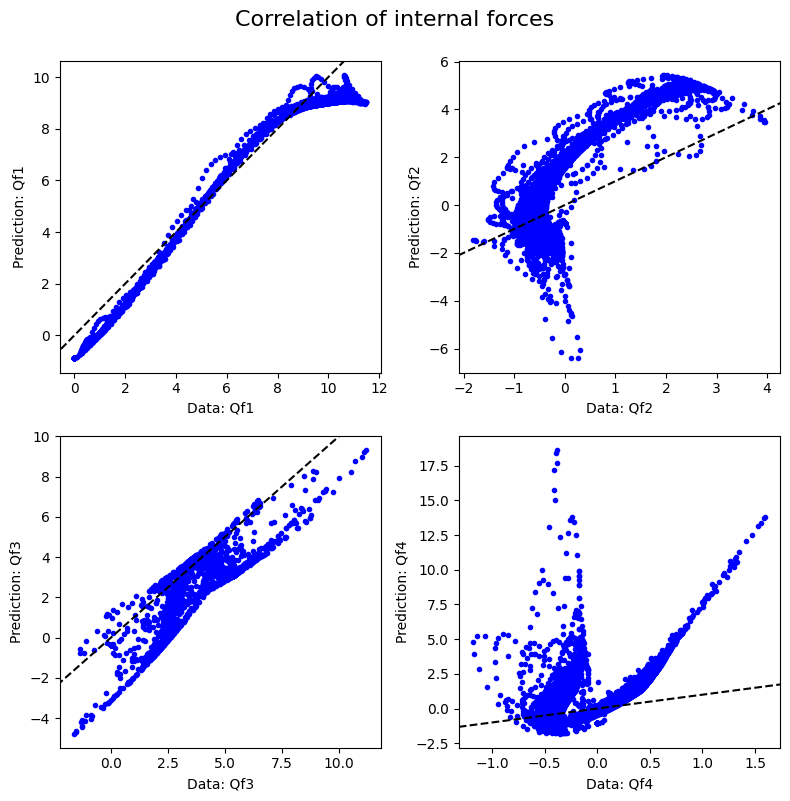

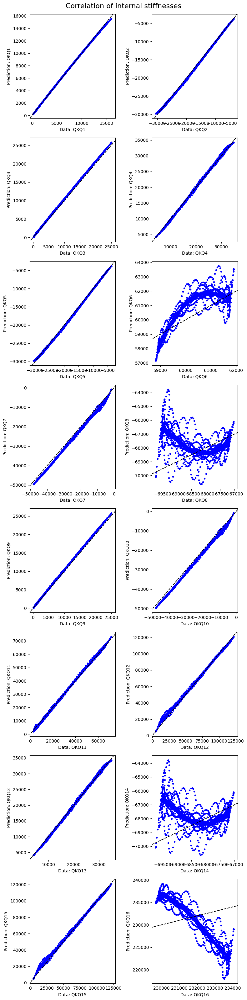

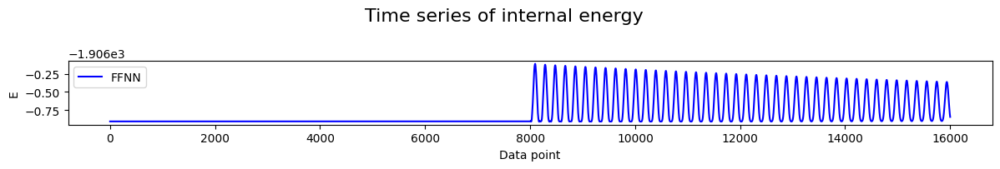

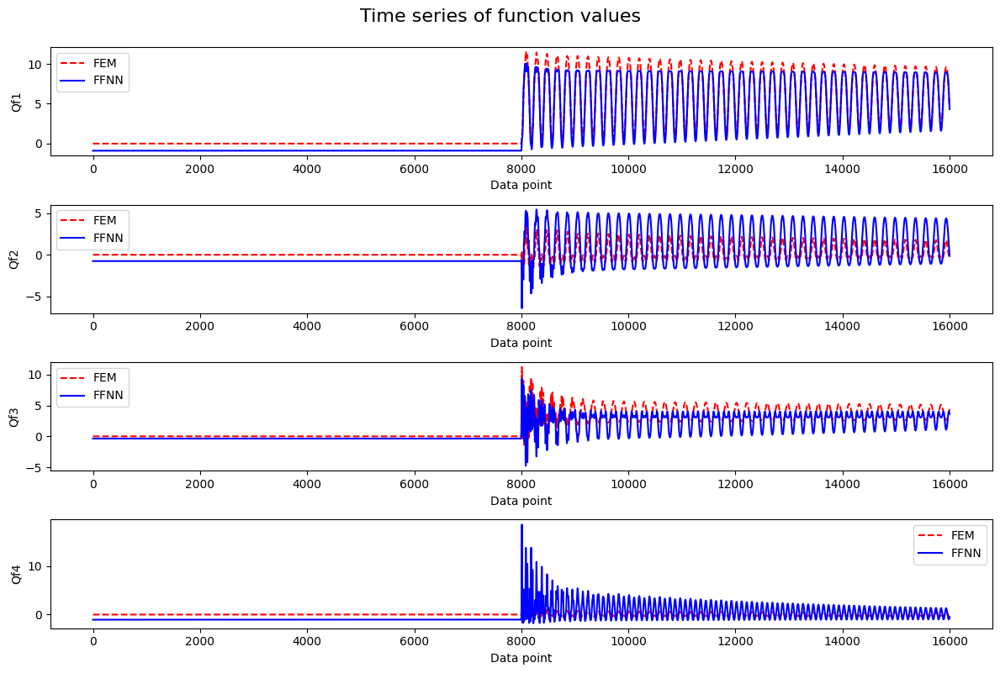

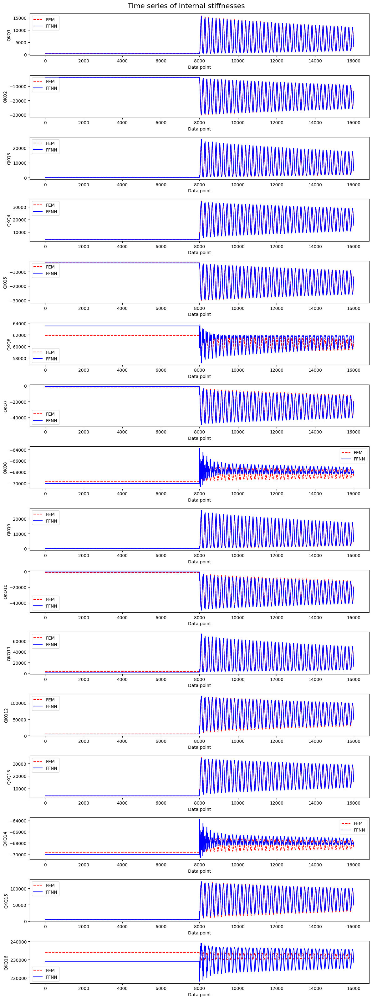

In [17]:
from paml_rom import plot

plot.plot_predictions(q_test, Qf_test, Qf_pred_test, QKQ_test, QKQ_pred_test, E_pred_test)